Student name: Tianyi Zou

Student ID: 260724913

In [93]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

1 Compute SIFT keypoints and corresponding descriptors for left and cen-tral images.

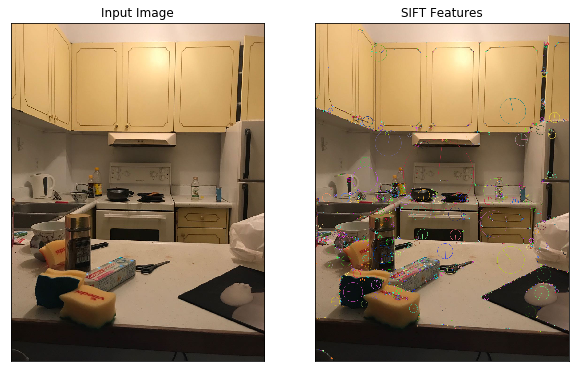

Num keypoints: 1894


In [94]:
#1 Compute SIFT keypoints and corresponding descriptors for left and cen-tral images.
# load image 
img = cv2.imread("middle.jpeg")

# copy image
img_disp = img.copy()
# convert to RGB
#img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#img_disp = cv2.cvtColor(img_disp, cv2.COLOR_BGR2RGB)

# create a SIFT object
sift = cv2.xfeatures2d.SIFT_create()

# detect SIFT features, with no masks
keypoints = sift.detect(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), None)

# draw the keypoints
cv2.drawKeypoints(img, keypoints, img_disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
#sift = cv2.xfeatures2d.SIFT_create()
#hill1_kp, hill1_des = sift.detectAndCompute(cv2.cvtColor(hill1, cv2.COLOR_BGR2RGB), None)
# display
plt.figure(figsize=(10,10))

plt.subplot(121), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Input Image"), plt.xticks([]), plt.yticks([])

plt.subplot(122), plt.imshow(cv2.cvtColor(img_disp, cv2.COLOR_BGR2RGB))
plt.title("SIFT Features"), plt.xticks([]), plt.yticks([])
plt.show()

# num of SIFT keypoints
print('Num keypoints: '+ str(len(keypoints)))

descriptors size: (1894, 128)


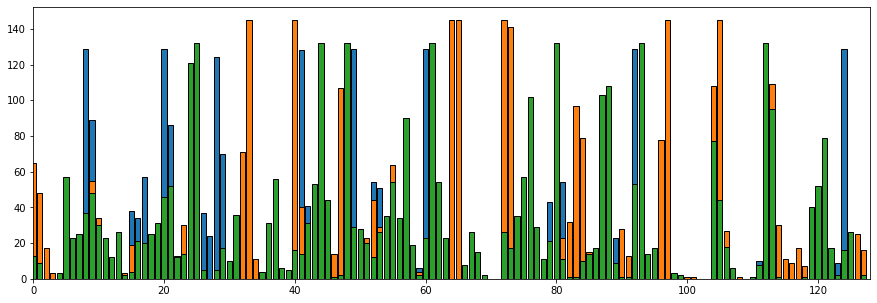

In [95]:
####################
# SIFT DESCRIPTORS #
####################

# load image 
img = cv2.imread("middle.jpeg")

# create a SIFT object
sift = cv2.xfeatures2d.SIFT_create()

# detect SIFT features, with no masks
keypoints = sift.detect(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), None)


# compute SIFT descriptors
keypoints, descriptors = sift.compute(img, keypoints)

# num of SIFT keypoints/descriptors
print('descriptors size: '+ str(descriptors.shape))

# plot a couple of 1x128 SIFT descriptors
#feature value == length of each bar
num = 3
plt.figure(figsize=(15,5))
for i in range(num):
    # plot the 128x1 np array using matplotlib plot()
    #plt.plot(descriptors[i], linestyle='--')
    plt.bar(np.arange(0,128),descriptors[i], edgecolor='k' )
    plt.xlim([0,128]) # set x-axis limit
plt.show()

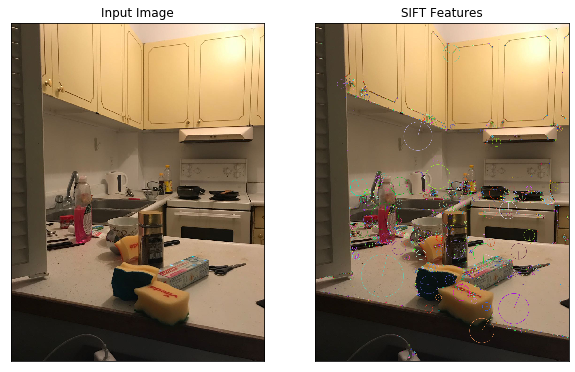

Num keypoints: 2024


In [96]:

# load image 
img_left = cv2.imread("left.jpeg")
# copy image
img_disp_left = img_left.copy()
# convert to RGB
#img_left = cv2.cvtColor(img_left, cv2.COLOR_BGR2RGB)
img_disp_left = cv2.cvtColor(img_disp_left, cv2.COLOR_BGR2RGB)

# create a SIFT object
sift = cv2.xfeatures2d.SIFT_create()

# detect SIFT features, with no masks

keypoints = sift.detect(cv2.cvtColor(img_left, cv2.COLOR_BGR2RGB), None)
# draw the keypoints
cv2.drawKeypoints(img_left, keypoints, img_disp_left, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)


# display
plt.figure(figsize=(10,10))
plt.subplot(121), plt.imshow(cv2.cvtColor(img_left, cv2.COLOR_BGR2RGB))
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(cv2.cvtColor(img_disp_left, cv2.COLOR_BGR2RGB))
plt.title("SIFT Features"), plt.xticks([]), plt.yticks([])
plt.show()

# num of SIFT keypoints
print('Num keypoints: '+ str(len(keypoints)))

descriptors size: (2024, 128)


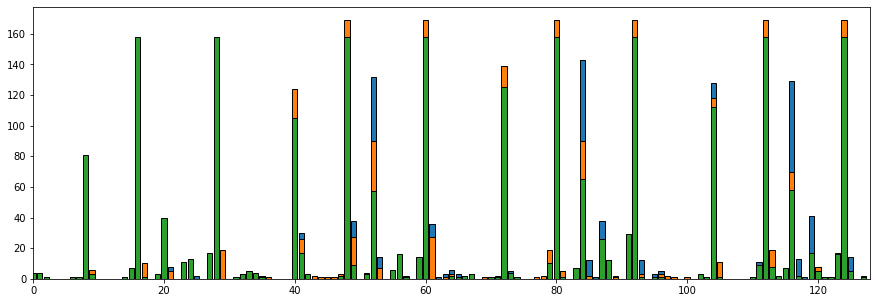

In [98]:
####################
# SIFT DESCRIPTORS #
####################

# load image 
img_left = cv2.imread("left.jpeg")

# create a SIFT object
sift = cv2.xfeatures2d.SIFT_create()

# detect SIFT features, with no masks

keypoints = sift.detect(cv2.cvtColor(img_left, cv2.COLOR_BGR2RGB), None)
# compute SIFT descriptors
keypoints, descriptors = sift.compute(img_left, keypoints)

# Alternatively, we can use keypoints,descriptors = sift.detectAndCompute(gray,None) to get both

# num of SIFT keypoints/descriptors
print('descriptors size: '+ str(descriptors.shape))

# plot a couple of 1x128 SIFT descriptors
#feature value == length of each bar
num = 3
plt.figure(figsize=(15,5))
for i in range(num):
    # plot the 128x1 np array using matplotlib plot()
    #plt.plot(descriptors[i], linestyle='--')
    plt.bar(np.arange(0,128),descriptors[i], edgecolor='k' )
    plt.xlim([0,128]) # set x-axis limit
plt.show()

2. Find matching keypoints in two images and display the 20 best pairs.
3. Find homography using RANSAC method. (I didn't figure out how to implement RANSAC. I used the provided cv2 method to complete the rest of jobs. ) 
4. Apply transformation to left image. Central image should not be transformed.

2024 1894


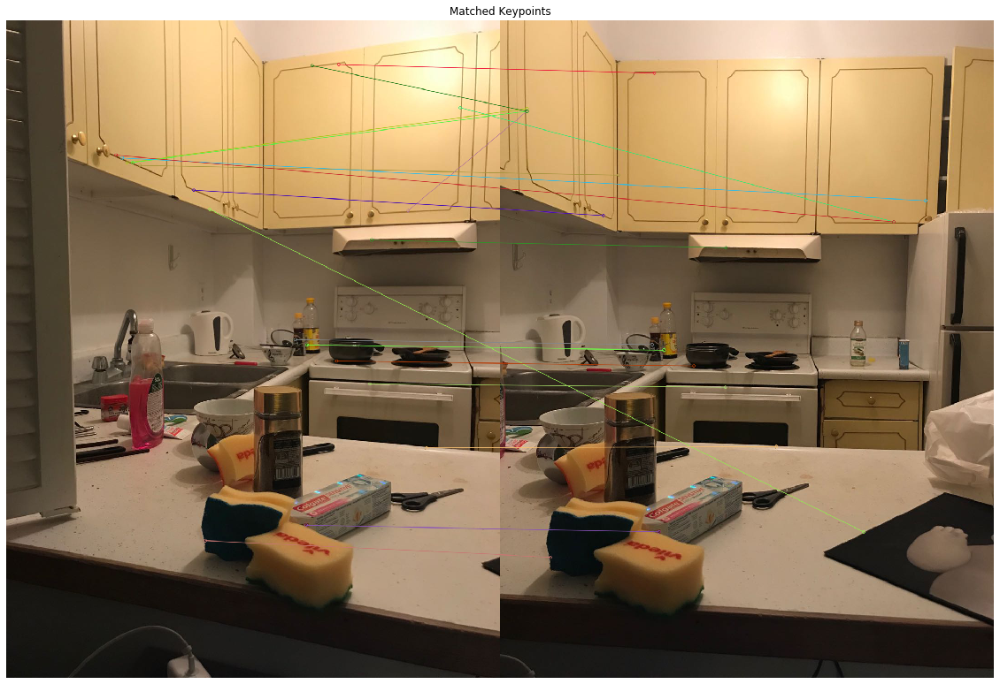

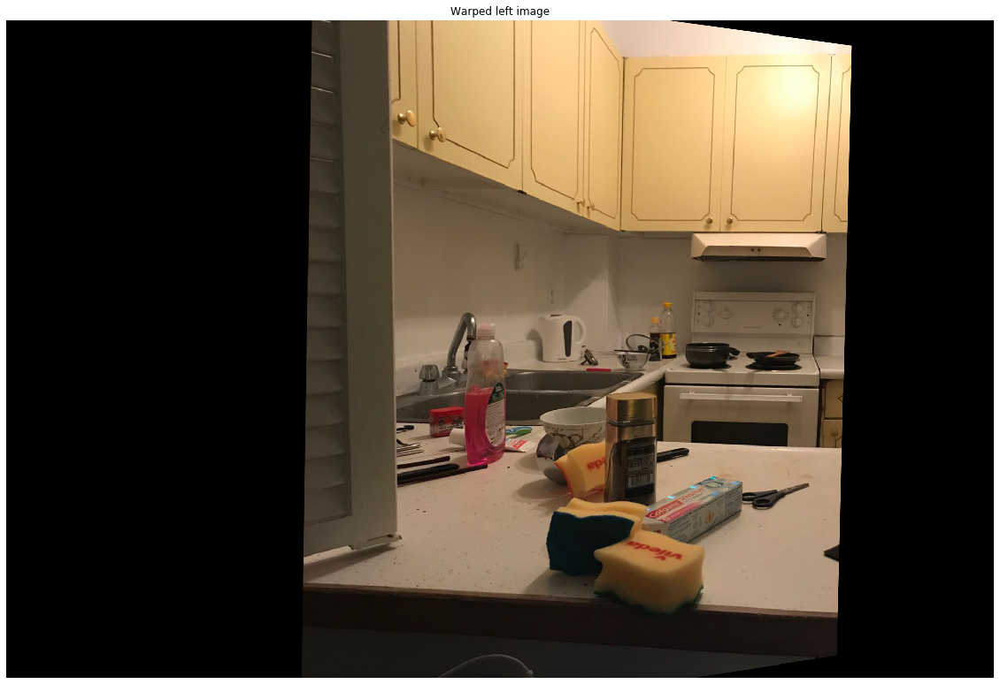

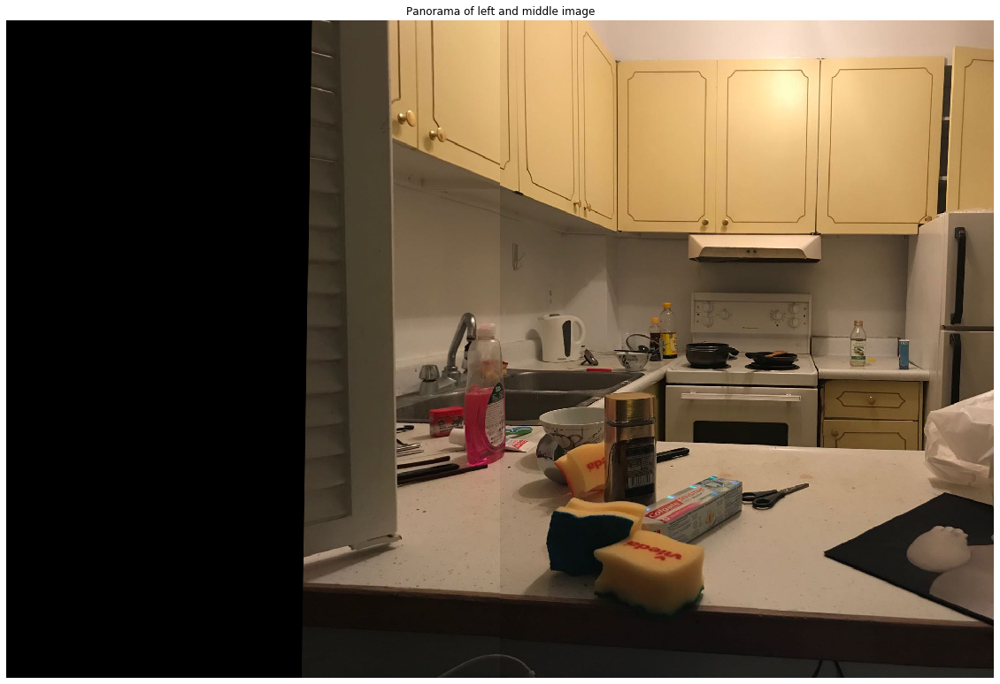

In [99]:
# 2. Find matching keypoints in two images and display the 20 best pairs.
img_l = cv2.imread('left.jpeg')
img_r = cv2.imread('middle.jpeg')

sift_obj = cv2.xfeatures2d.SIFT_create()
keypoints_l, descriptors_l = sift_obj.detectAndCompute(cv2.cvtColor(img_l, cv2.COLOR_BGR2RGB), None)
keypoints_r, descriptors_r = sift_obj.detectAndCompute(cv2.cvtColor(img_r, cv2.COLOR_BGR2RGB), None)
print(len(keypoints_l),len(keypoints_r))

bf = cv2.BFMatcher()
matches = bf.match(descriptors_l, descriptors_r)
matches = sorted(matches, key = lambda x:x.distance)
match_img = cv2.drawMatches(img_l, keypoints_l, img_r, keypoints_r, matches[:20], img_l, flags=2)

plt.figure(figsize=(20, 20))
plt.imshow(cv2.cvtColor(match_img, cv2.COLOR_BGR2RGB))
plt.title("Matched Keypoints"), plt.axis('off')
plt.show()
Good_matches = []
for match in matches:
    Good_matches.append((match.trainIdx, match.queryIdx))
    
mpl = np.float32([keypoints_l[i].pt for (_, i) in Good_matches])
mpr = np.float32([keypoints_r[i].pt for (i, _) in Good_matches])

for point in mpr:
    point[0] += img_r.shape[1]

#3. Find homography using RANSAC method. Implement RANSAC from scratch. 
# Find homography using RANSAC
H, _ = cv2.findHomography(mpl, mpr, cv2.RANSAC, 4)

#4. Apply transformation to left image. Central image should not be transformed.

image_warped = cv2.warpPerspective(img_l, H, (img_l.shape[1] + img_r.shape[1], img_r.shape[0]))

panorama = image_warped.copy()
panorama[:, img_r.shape[1]:, :] = img_r

plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(image_warped, cv2.COLOR_BGR2RGB))
plt.title('Warped left image'), plt.axis('off')
plt.show()

plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB))
plt.title('Panorama of left and middle image'), plt.axis('off')
plt.show()

5. Stitch transformed left image and original central image together using pyramid image blending.
6. Display stitched image.

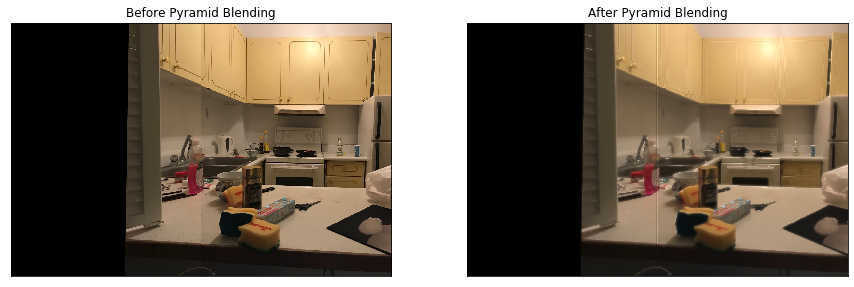

In [100]:
image_left = np.zeros((image_warped.shape[0], image_warped.shape[1], image_warped.shape[2]),np.uint8)
image_left[:, image_warped.shape[1] - img_r.shape[1]:,:] = img_r

imgA = image_warped
imgB = image_left

A = imgA.copy()
B = imgB.copy()


levels = 4

# generate Gaussian pyramid for A
G = A.copy()
gpA = [G]
for i in range(levels):
    G = cv2.pyrDown(G)
    gpA.append(G)
# generate Gaussian pyramid for B
G = B.copy()
gpB = [G]
for i in range(levels):
    G = cv2.pyrDown(G)
    gpB.append(G)
# generate Laplacian Pyramid for A
lpA = [gpA[levels-1]]
for i in range(levels-1,0,-1):
    GE = cv2.pyrUp(gpA[i],dstsize = (gpA[i-1].shape[1],gpA[i-1].shape[0]))
    L = cv2.subtract(gpA[i-1],GE,cv2.CV_32F)
    lpA.append(L)
# generate Laplacian Pyramid for B
lpB = [gpB[levels-1]]
for i in range(levels-1,0,-1):
    GE = cv2.pyrUp(gpB[i],dstsize = (gpB[i-1].shape[1],gpB[i-1].shape[0]))
    L = cv2.subtract(gpB[i-1],GE)
    lpB.append(L)
    
# Now add left and right halves of images in each level
LS = []
for la,lb in zip(lpA,lpB):
    rows,cols,dpt = la.shape
    lp = np.hstack((la[:,:round(cols/2)], lb[:,round(cols/2):]))
    LS.append(lp)
# now reconstruct
ls_ = LS[0]
for i in range(1,levels):
    ls_ = cv2.pyrUp(ls_)
    ls_ = cv2.add(ls_, LS[i])
# image with direct connecting each half
real = np.hstack((A[:,:cols//2],B[:,cols//2:]))

# display results
plt.figure(figsize=(15,15))
plt.subplot(121), plt.imshow(cv2.cvtColor(real, cv2.COLOR_RGB2BGR))
plt.title('Before Pyramid Blending'), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(cv2.cvtColor(ls_, cv2.COLOR_RGB2BGR))
plt.title('After Pyramid Blending'), plt.xticks([]), plt.yticks([])
plt.show()

7. Compute SURF keypoints and corresponding descriptors for above stitched image and right image.

Num keypoints: 5511in the stitched image 
Num keypoints: 3523in the right image 


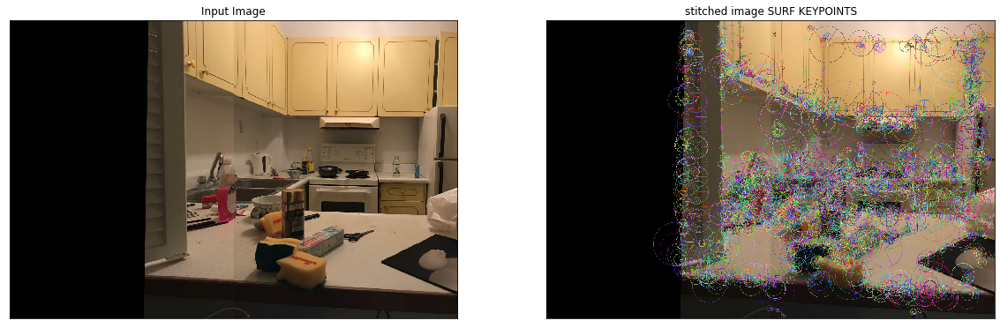

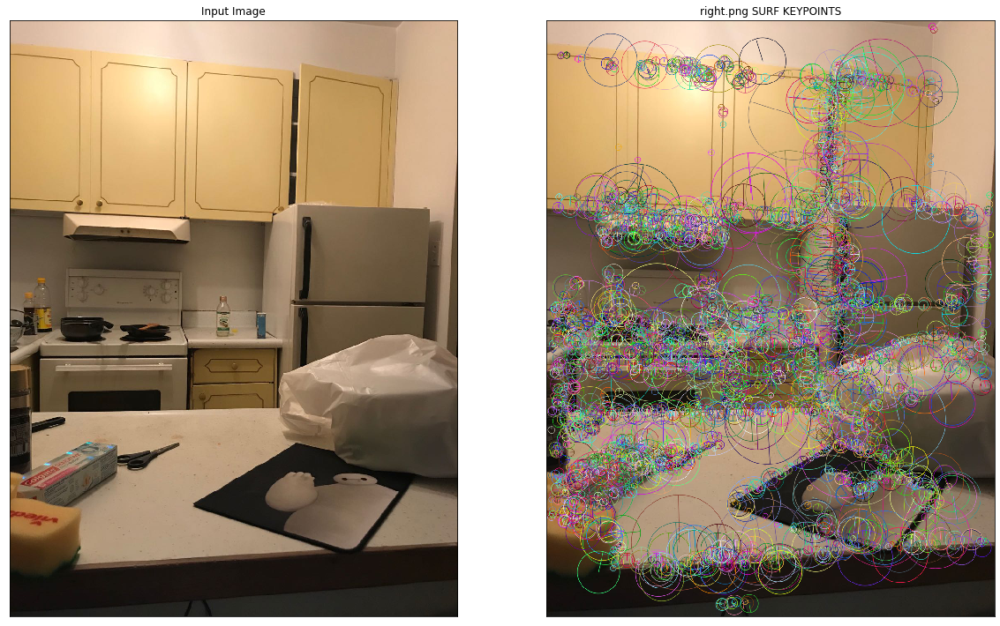

In [101]:
#7. Compute SURF keypoints and corresponding descriptors for above stitched image and right image.
# load image 

img_lm=cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB)
img_lm_disp = img_lm.copy()
img3 = cv2.imread("right.jpeg")
img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
img3_disp = img3.copy()

surf = cv2.xfeatures2d.SURF_create()

# detect SIFT features, with no masks
keypoints3, descriptors3 = surf.detectAndCompute(img3, None)
keypoints_lm, descriptors_lm=surf.detectAndCompute(img_lm, None)

cv2.drawKeypoints(img3, keypoints3, img3_disp, flags=6)
cv2.drawKeypoints(img_lm, keypoints_lm, img_lm_disp, flags=6)
# display keypoints as a visual check.

print('Num keypoints: '+ str(len(keypoints_lm))+'in the stitched image ')
print('Num keypoints: '+ str(len(keypoints3))+'in the right image ')

plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(img_lm)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img_lm_disp)
plt.title("stitched image SURF KEYPOINTS"), plt.xticks([]), plt.yticks([])
plt.show()
plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(img3)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img3_disp)
plt.title("right.png SURF KEYPOINTS"), plt.xticks([]), plt.yticks([])
plt.show()

descriptors size: (2366, 128)in the stitched image 


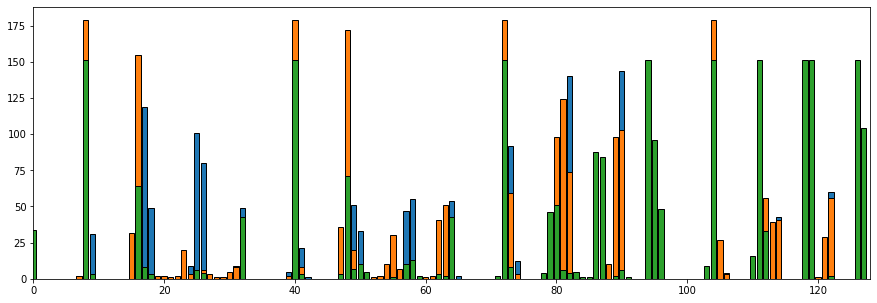

In [102]:
####################
# SIFT DESCRIPTORS #
####################

# load image 
img_left = img_lm

# create a SIFT object
sift = cv2.xfeatures2d.SIFT_create()

# detect SIFT features, with no masks

keypoints = sift.detect(cv2.cvtColor(img_left, cv2.COLOR_BGR2RGB), None)
# compute SIFT descriptors
keypoints, descriptors = sift.compute(img_left, keypoints)

# Alternatively, we can use keypoints,descriptors = sift.detectAndCompute(gray,None) to get both

# num of SIFT keypoints/descriptors
print('descriptors size: '+ str(descriptors.shape)+'in the stitched image ')

# plot a couple of 1x128 SIFT descriptors
#feature value == length of each bar
num = 3
plt.figure(figsize=(15,5))
for i in range(num):
    # plot the 128x1 np array using matplotlib plot()
    #plt.plot(descriptors[i], linestyle='--')
    plt.bar(np.arange(0,128),descriptors[i], edgecolor='k' )
    plt.xlim([0,128]) # set x-axis limit
plt.show()

descriptors size: (1538, 128)in the right image 


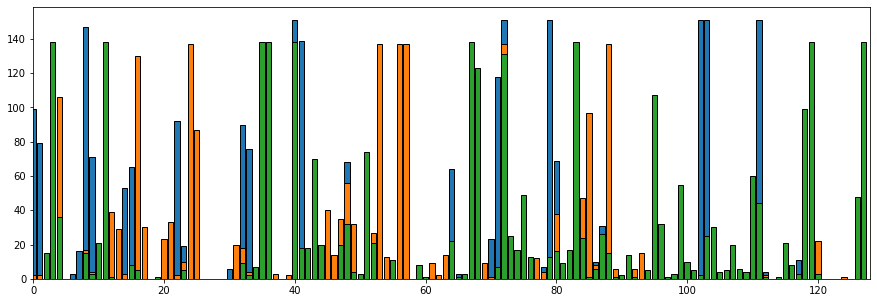

In [103]:
####################
# SIFT DESCRIPTORS #
####################

# load image 
img = img3

# create a SIFT object
sift = cv2.xfeatures2d.SIFT_create()

# detect SIFT features, with no masks
keypoints = sift.detect(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), None)


# compute SIFT descriptors
keypoints, descriptors = sift.compute(img, keypoints)

# num of SIFT keypoints/descriptors
print('descriptors size: '+ str(descriptors.shape)+'in the right image ')

# plot a couple of 1x128 SIFT descriptors
#feature value == length of each bar
num = 3
plt.figure(figsize=(15,5))
for i in range(num):
    # plot the 128x1 np array using matplotlib plot()
    #plt.plot(descriptors[i], linestyle='--')
    plt.bar(np.arange(0,128),descriptors[i], edgecolor='k' )
    plt.xlim([0,128]) # set x-axis limit
plt.show()

8. Find matching keypoints in two images and display the 20 best pairs.
9. Find homography using RANSAC method. Use above implemented RANSAC function. Do not use OpenCV implementation.
10. Apply transformation to right image. The stitched image should not be transformed. Use OpenCV function warpPerspective for image transformation.

2435 1555


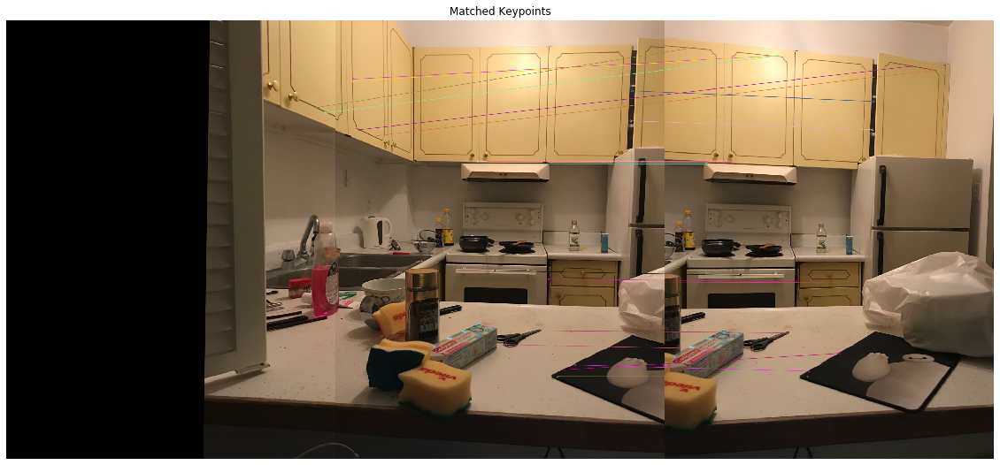

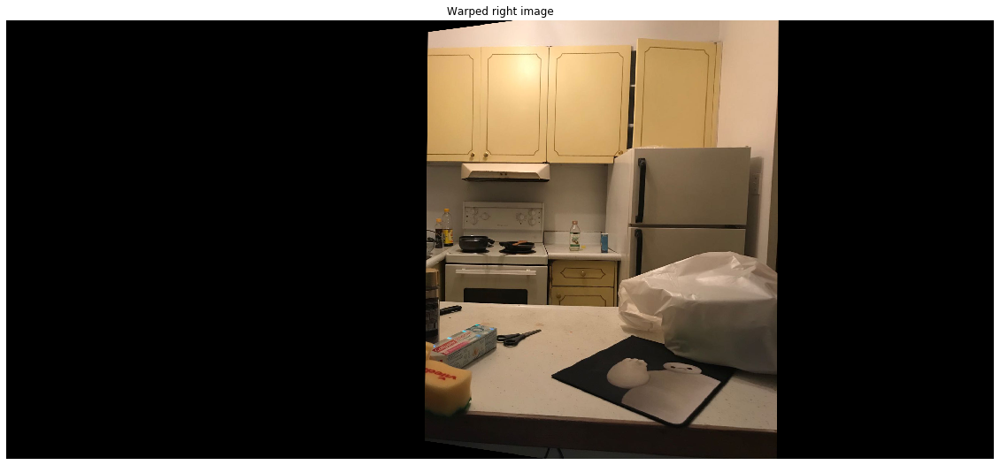

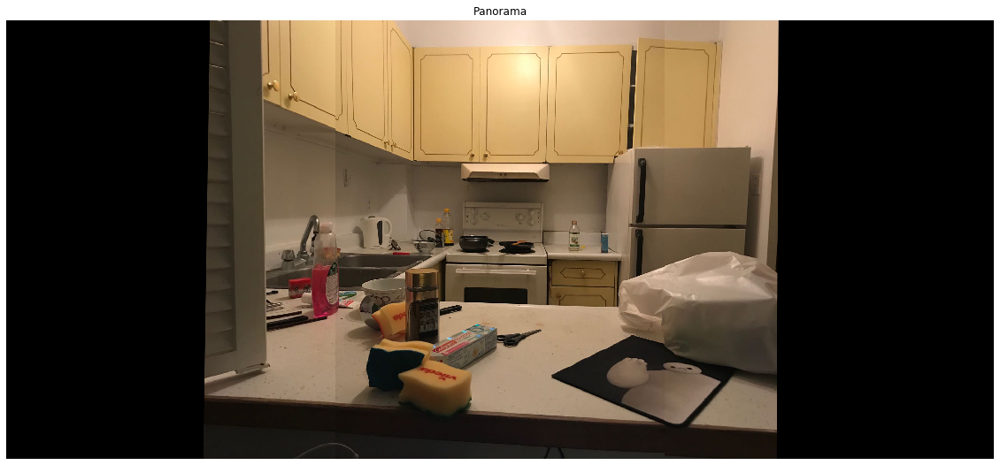

In [104]:
# 8. Find matching keypoints in two images and display the 20 best pairs.
img_l = img_lm.copy()
img_r = img3.copy()

sift_obj = cv2.xfeatures2d.SIFT_create()
#keypoints_l, descriptors_l = sift_obj.detectAndCompute(cv2.cvtColor(img_l, cv2.COLOR_BGR2RGB), None)
#keypoints_r, descriptors_r = sift_obj.detectAndCompute(cv2.cvtColor(img_r, cv2.COLOR_BGR2RGB), None)
keypoints_l, descriptors_l = sift_obj.detectAndCompute(img_l, None)
keypoints_r, descriptors_r = sift_obj.detectAndCompute(img_r, None)
print(len(keypoints_l),len(keypoints_r))

bf = cv2.BFMatcher()
matches = bf.match(descriptors_l, descriptors_r)
matches = sorted(matches, key = lambda x:x.distance)
match_img = cv2.drawMatches(img_l, keypoints_l, img_r, keypoints_r, matches[:20], img_l, flags=2)

plt.figure(figsize=(20, 20))

#plt.imshow(cv2.cvtColor(match_img, cv2.COLOR_BGR2RGB))
plt.imshow(match_img)
plt.title("Matched Keypoints"), plt.axis('off')
plt.show()


Good_matches = []
for match in matches:
    Good_matches.append((match.trainIdx, match.queryIdx))
    
mpl = np.float32([keypoints_l[i].pt for (_, i) in Good_matches])
mpr = np.float32([keypoints_r[i].pt for (i, _) in Good_matches])

#for point in mpr:
#    point[0] += imgr.shape[1]

#9. Find homography using RANSAC method. Implement RANSAC from scratch. 
# Find homography using RANSAC
H, _ = cv2.findHomography(mpr, mpl, cv2.RANSAC, 4)

#10. Apply transformation to left image. Central image should not be transformed.
image_warped = cv2.warpPerspective(img_r, H, (img_l.shape[1]+img_r.shape[1], img_l.shape[0]))
panorama = image_warped.copy()
panorama[:, :img_l.shape[1], :] = img_l



plt.figure(figsize=(20,20))
#plt.imshow(cv2.cvtColor(image_warped, cv2.COLOR_BGR2RGB))
plt.imshow(image_warped)
plt.title('Warped right image'), plt.axis('off')
plt.show()

plt.figure(figsize=(20,20))
#plt.imshow(cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB))
plt.imshow(panorama)
plt.title('Panorama'), plt.axis('off')
plt.show()

11. Stitch transformed right image and already stitched left and central images together using linear image blending.

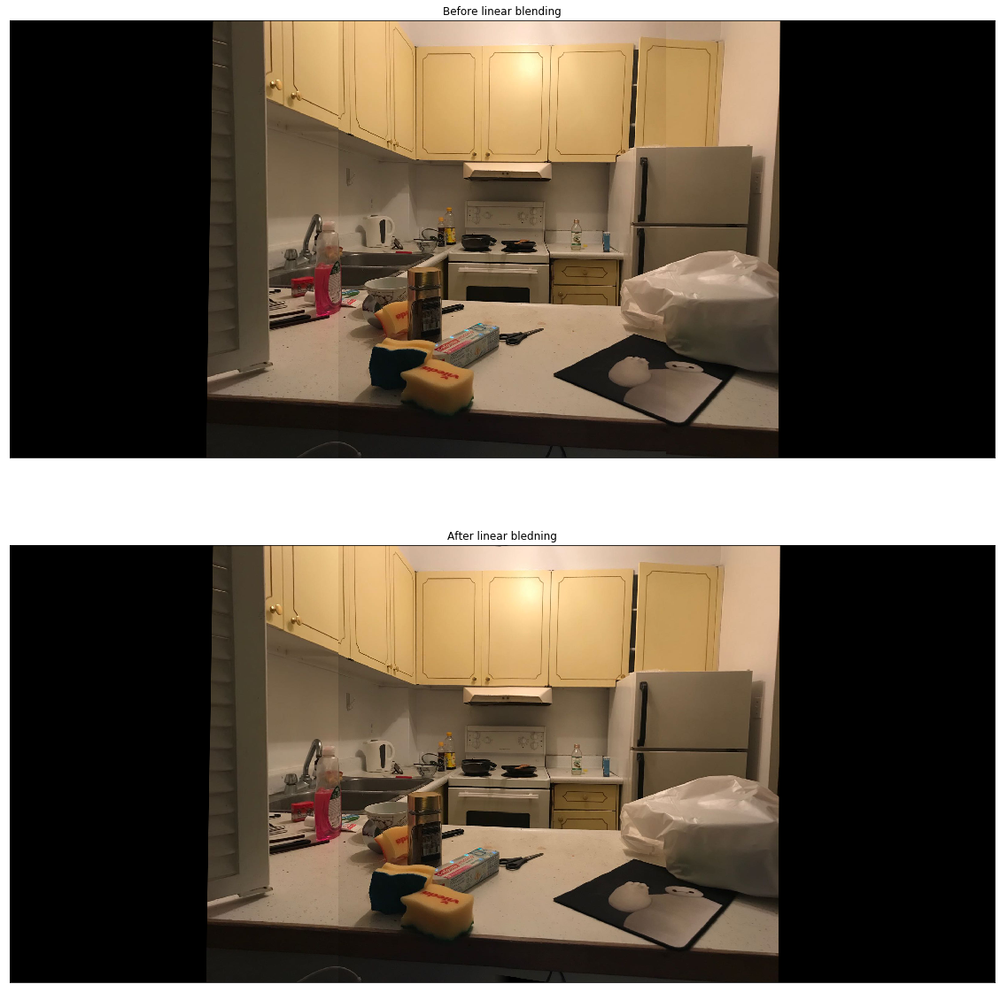

In [105]:
# linear blending
##################
# IMAGE BLENDING #
##################

def Ramp(i_width, r_width, r_index, start, end):
    a = np.zeros((i_width)).astype(np.float)
    step = (end - start) / (r_width-1)
    idx = round(r_index - (r_width/2))  
    for i in range(r_width):
        a[idx] = start + step*i
        idx += 1
    a[idx:] = 1
    return a

# alpha blending ramp
ramp_size = 50  # alpha blending ramp size
alpha = Ramp(image_warped.shape[1], ramp_size, round(image_warped.shape[1]/2), 0, 1)

# Now blend
I_blend = (1-alpha.reshape(1,-1,1)) * panorama + alpha.reshape(1,-1,1)*image_warped
I_blend = np.uint8(I_blend) 

# display images
plt.figure(figsize=(20,20))

#plt.subplot(211), plt.imshow(cv2.cvtColor(panorama, cv2.COLOR_RGB2BGR))
plt.subplot(211), plt.imshow(panorama)
plt.title("Before linear blending"), plt.xticks([]), plt.yticks([])
plt.subplot(212), plt.imshow(I_blend)
plt.title("After linear bledning"), plt.xticks([]), plt.yticks([])
plt.show()

12. Compare and comment on effectiveness of pyramid and linear blending. Discuss the pros and cons of both methods.

Linear bledning takes the weighted average pixels. The advantage of linear blending is that linear blending has lower cost compared with the pyramid blending.
The disadvantage is that it only gives a good smoothing performance at low frequencies. 

Pyramid blending performs well at both low and high frequencies. However, it is slower and has high cpu cost. 

Part 2 Object Detection

1. Resize the training images to 128  128. (1 points)

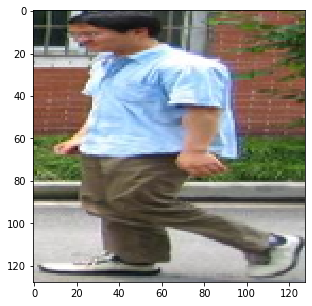

(128, 128, 3)


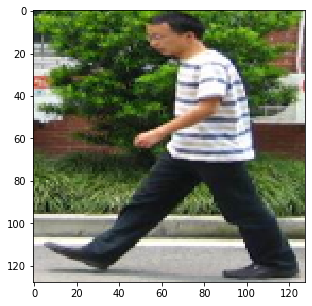

(128, 128, 3)


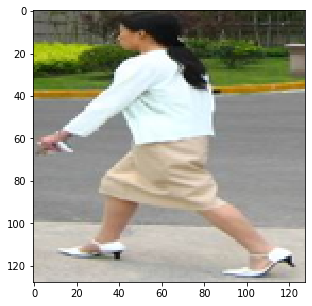

(128, 128, 3)


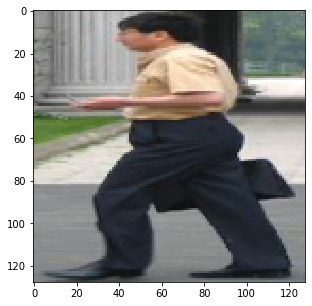

(128, 128, 3)


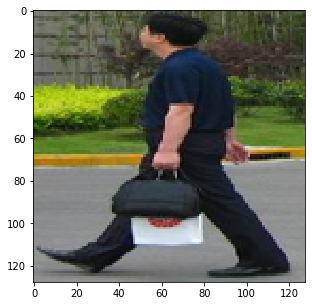

(128, 128, 3)


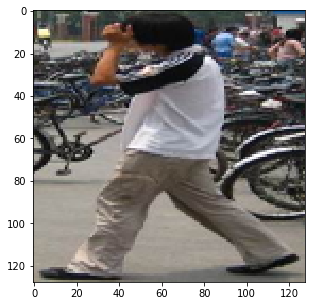

(128, 128, 3)


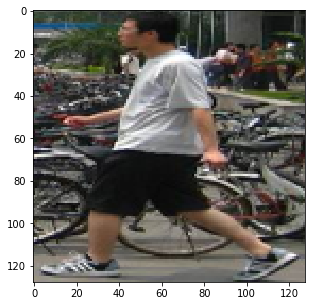

(128, 128, 3)


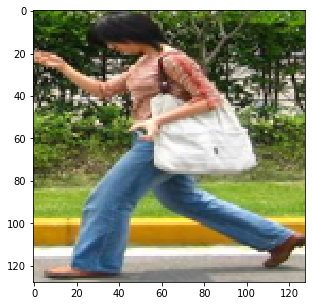

(128, 128, 3)


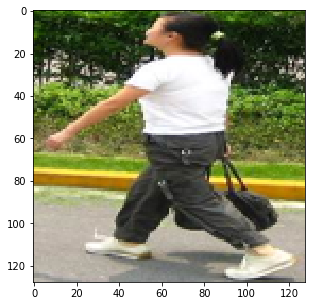

(128, 128, 3)


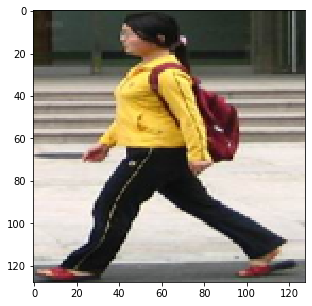

(128, 128, 3)


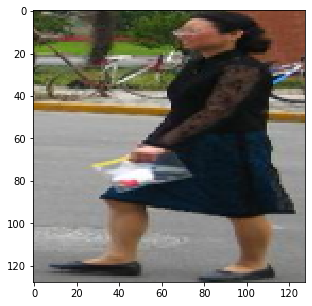

(128, 128, 3)


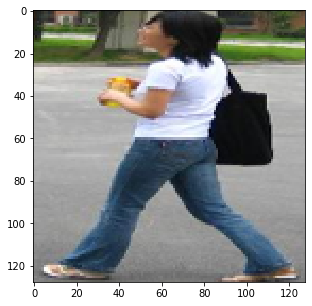

(128, 128, 3)


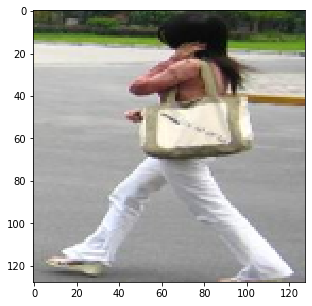

(128, 128, 3)


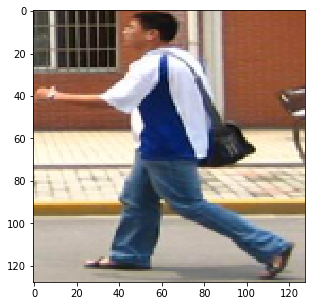

(128, 128, 3)


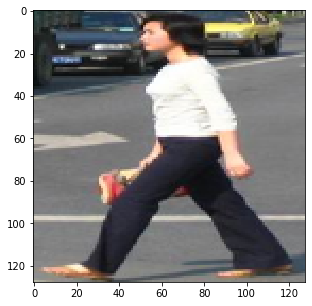

(128, 128, 3)


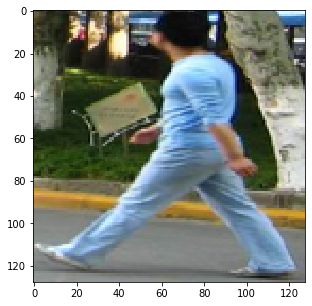

(128, 128, 3)


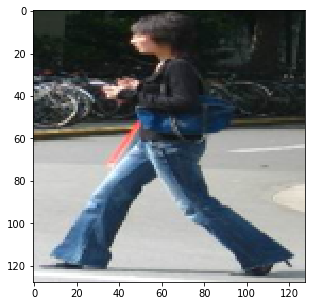

(128, 128, 3)


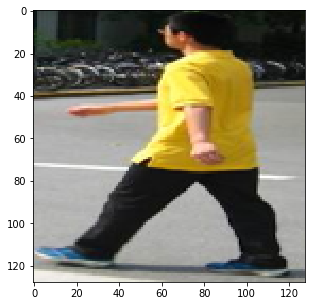

(128, 128, 3)


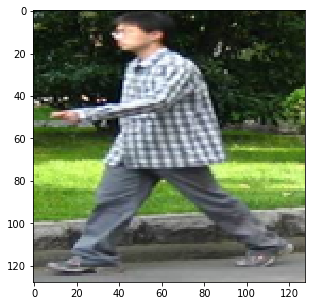

(128, 128, 3)


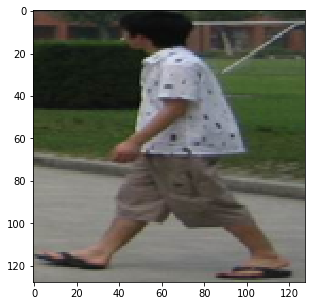

(128, 128, 3)


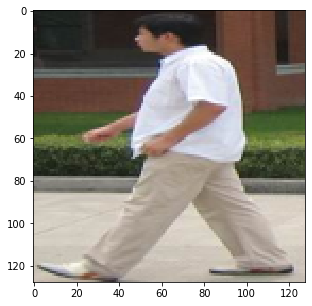

(128, 128, 3)


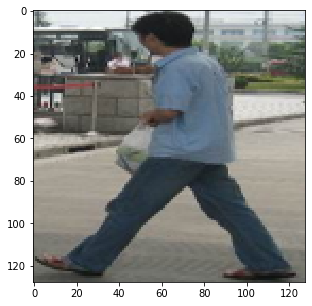

(128, 128, 3)


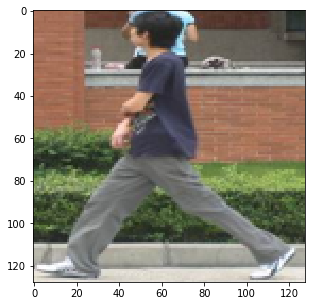

(128, 128, 3)


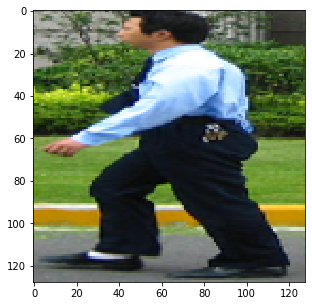

(128, 128, 3)


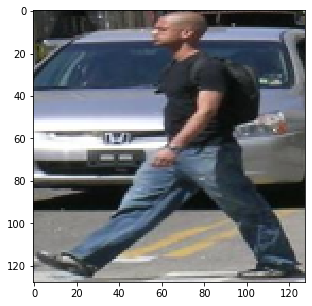

(128, 128, 3)


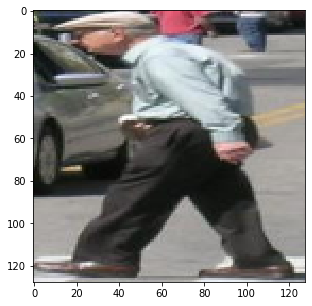

(128, 128, 3)


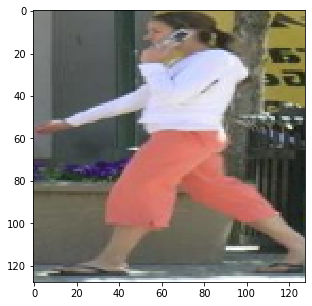

(128, 128, 3)


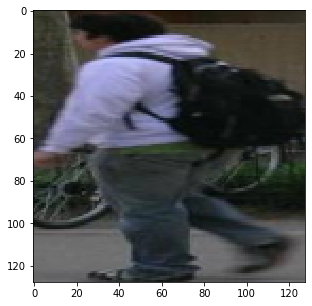

(128, 128, 3)


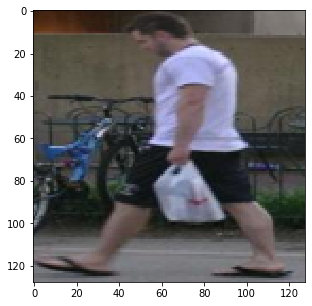

(128, 128, 3)


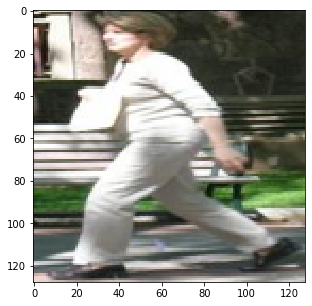

(128, 128, 3)


In [106]:
#Training
#1.Resize the training image
# Resize the training images to 128 × 128.
people = []
for num in range(1,31):
    people.append("p{number}.png".format(number=num))

resized_imgs = []
for img in people:
    img1 = cv2.imread(img)
   
    resized_imgs.append(cv2.resize( cv2.cvtColor(img1, cv2.COLOR_BGR2RGB),(128,128)))
for i in range(30): 
    plt.figure(figsize=(5,5))
    plt.imshow(resized_imgs[i])
    plt.show()
    print(resized_imgs[i].shape)







2. Compute HoG features using cell size of 4*4 pixels, block size of2*2 cells and 9 orientation bins
3. Calculate and store the mean feature map across training images.
4. Display 9 orientation channels of the mean feature maps for the first block.

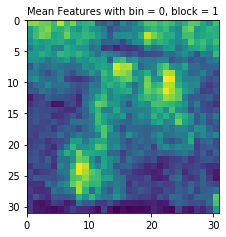

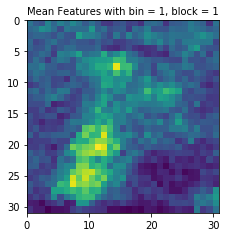

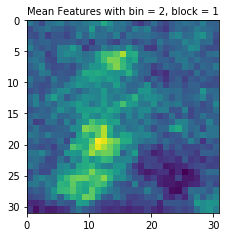

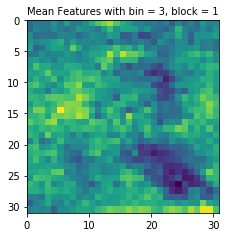

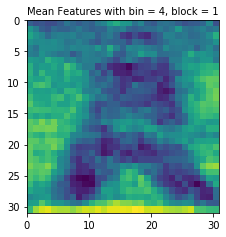

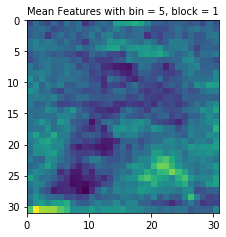

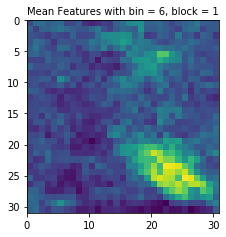

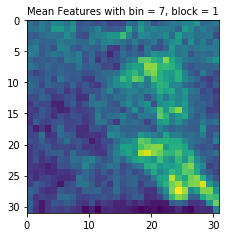

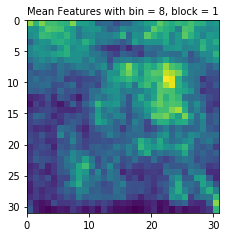

In [107]:
#2. Compute HoG features using cell size of 4*4 pixels, block size of2*2 cells and 9 orientation bins 
def hog_f(imgs):
    
    cell_size = (4, 4)  # h x w in pixels
    block_size = (2, 2)  # h x w in cells
    nbins = 9  # number of orientation bins
    
    the_HoG_features = []
    for img in imgs:
   
        hog = cv2.HOGDescriptor(_winSize=(img.shape[1] // cell_size[1] * cell_size[1],
                                          img.shape[0] // cell_size[0] * cell_size[0]),
                                _blockSize=(block_size[1] * cell_size[1],
                                            block_size[0] * cell_size[0]),
                                _blockStride=(cell_size[1], cell_size[0]),
                                _cellSize=(cell_size[1], cell_size[0]),
                                _nbins=nbins)

        n_cells = (img.shape[0] // cell_size[0], img.shape[1] // cell_size[1])
        
        

        
        hog_feats = hog.compute(img) \
                       .reshape(n_cells[1] - block_size[1] + 1,
                                n_cells[0] - block_size[0] + 1,
                                block_size[1], block_size[0], nbins) \
                       .transpose((1, 0, 3, 2, 4))  # index blocks by rows first
        
        the_HoG_features.append(hog_feats)
        
    return the_HoG_features


hog_features = hog_f(resized_imgs)

# 3.Calculate and store the mean feature map across training images

feature_mean = sum(hog_features) / len(hog_features)

#print(feature_mean)

#4.Display 9 orientation channels of the mean feature maps for the first block.
for i in range(9):
    plt.figure(figsize = (20,20))
    
    plt.subplot(151)
    plt.pcolor(feature_mean[:, :, 0,0,i]) 
    plt.gca().invert_yaxis()
    plt.gca().set_aspect('equal', adjustable='box')
    plt.title("Mean Features with bin = {}, block = 1".format(i),fontsize=10)

    

Testing
1. Extract overlapping windows from the test image. Experiment with stride and size of the window to achieve good performance.
2. Resize windows to 128*128 and Compute HoG features similar to what was done during training.

In [108]:
#Testing
#2. Resize windows to 128*128 and Compute HoG features similar to what was done during training.
img_t = cv2.imread("test_image.png")   #gray scale

img_t = cv2.cvtColor(img_t, cv2.COLOR_BGR2RGB)
def obj_detect(image):
    stride=16
    winsize=[216,446]
    # slide a window across the image
    for i in range(0, image.shape[0], stride):
        for j in range(0, image.shape[1], stride):
            yield image[i:i + winsize[1], j:j + winsize[0]]
            
overlapping_windows = obj_detect(img_t)

resized_windows = []
for i in overlapping_windows:
    resized_window=cv2.resize(i,(128,128))
    resized_windows.append(resized_window)
    
hog_windows = hog_f(resized_windows)

3. Compute the Euclidean distance between the feature map of each window and the mean feature map of training images. (2 points)
4. Threshold the Euclidean distances to detect pedestrians in the test image. Display the detected window. Experiment with threshold values in order to achieve good performance.

There are 132 matches after detection


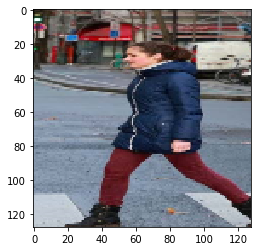

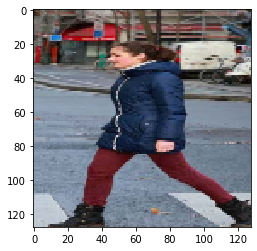

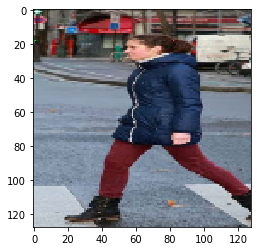

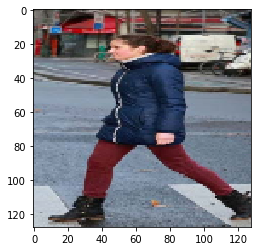

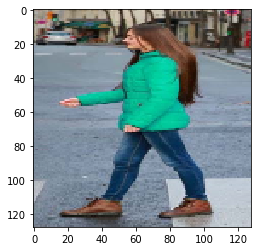

...

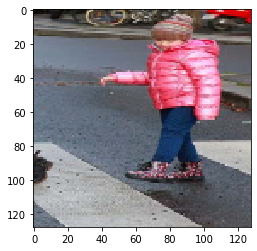

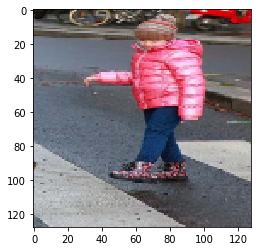

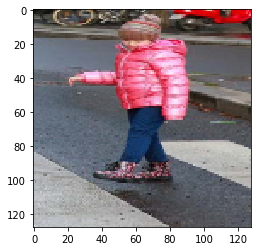

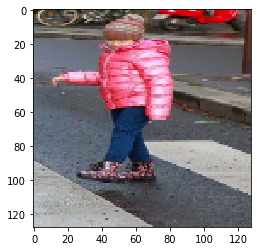

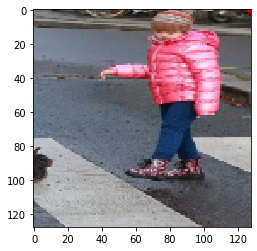

In [109]:
#3. Compute the Euclidean distance between the feature map of each window and the mean feature map of training images. (2 points)
distances = []

for window in hog_windows:
    euc_distance=cv2.norm(window,feature_mean, normType=cv2.NORM_L2, mask=None)
    distances.append(euc_distance)
    
#4. Threshold the Euclidean distances to detect pedestrians in the test image. Display the detected window. Experiment with threshold values in order to achieve good performance.
threshold=18.6
pedestrains = []

for index, value in enumerate(distances):
    if value<threshold:
        pedestrains.append(index)
print("There are {index} matches after detection".format(index=len(pedestrains)))
for index, indice in enumerate(pedestrains):
    if index == 45:
        break
    plt.imshow(resized_windows[indice])
    plt.show()




5. Discuss the performance of above method. Did you detect all four pedestrians in the test image? Suggest methods to improve results.

I am able to detect 3 out of 4 pedestrians by tunning the value of window size and stride. But it still detects some areas that do not include pedestrains.
To improve the results, first of all, we can do flipping on the image and learn the image features on the flipped images. 
During the detection, it will set another limit to the Euclidean distances, which gives a more accurate detection. 

The second method is to find a way to change the window size as it moves along the image. Since the objects to be detected have different features,
for example, the size of objects are different, an adjustable window size can help us better detect the window. 